<a href="https://colab.research.google.com/github/DipuBala/DipuBala/blob/my-etm/my_etm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!git clone https://github.com/pallabi-300/my_etm.git

Cloning into 'my_etm'...
remote: Enumerating objects: 68, done.
remote: Counting objects: 100% (68/68), done.
remote: Compressing objects: 100% (56/56), done.
remote: Total 68 (delta 8), reused 67 (delta 8), pack-reused 0
Receiving objects: 100% (68/68), 4.14 MiB | 2.38 MiB/s, done.
Resolving deltas: 100% (8/8), done.


In [3]:
%cd /content/my_etm

/content/my_etm


In [4]:
import numpy as np
import torch
from scipy.io import loadmat
from embedded_topic_model.utils.data import get_batch
from embedded_topic_model.models.etm import ETM

# Load vocabulary
vocabulary = np.load('/content/my_etm/embedded_topic_model/data/20ng/vocab.pkl', allow_pickle=True)

# Load training data
bow_tr_tokens = loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_tr_tokens.mat')['tokens']
bow_tr_counts = loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_tr_counts.mat')['counts']

# Convert tokens and counts to the correct format
# train_tokenss = [bow_tr_tokens[i][0] for i in range(bow_tr_tokens.shape[0])]
# train_counts = [bow_tr_counts[i][0] for i in range(bow_tr_counts.shape[0])]
# print(train_tokenss)

# train_tokens = bow_tr_tokens.copy()
# train_tokens = train_tokens.reshape(-1);
# for j in range(train_tokens.shape[0]):
#   train_tokens[j] = train_tokens[j].reshape(-1);


train_tkns = bow_tr_tokens.copy()
train_tkns = train_tkns.reshape(-1)
train_tokens = []
for j in range(train_tkns.shape[0]):
    # Reshape each token array and wrap it in another array
    token_array = train_tkns[j].reshape(-1)
    train_tokens.append(np.array([token_array]))


train_ctns = bow_tr_counts.copy()
train_ctns = train_ctns.reshape(-1)
train_counts = []
for j in range(train_ctns.shape[0]):
    # Reshape each token array and wrap it in another array
    token_array = train_ctns[j].reshape(-1)
    train_counts.append(np.array([token_array]))
# print(train_counts)

# Load validation data
bow_va_tokens = loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_va_tokens.mat')['tokens']
bow_va_counts = loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_va_counts.mat')['counts']

# Convert validation tokens and counts to the correct format
# valid_tokens = [bow_va_tokens[i][0] for i in range(bow_va_tokens.shape[0])]
# valid_counts = [bow_va_counts[i][0] for i in range(bow_va_counts.shape[0])]


valid_tkns = bow_va_tokens.copy()
valid_tkns = valid_tkns.reshape(-1)
valid_tokens = []
for j in range(valid_tkns.shape[0]):
    # Reshape each token array and wrap it in another array
    token_array = valid_tkns[j].reshape(-1)
    valid_tokens.append(np.array([token_array]))


valid_ctns = bow_va_counts.copy()
valid_ctns = valid_ctns.reshape(-1)
valid_counts = []
for j in range(valid_ctns.shape[0]):
    # Reshape each token array and wrap it in another array
    token_array = valid_ctns[j].reshape(-1)
    valid_counts.append(np.array([token_array]))


# Load test data
bow_ts_tokens = loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_ts_tokens.mat')['tokens']
bow_ts_counts = loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_ts_counts.mat')['counts']

# Convert test tokens and counts to the correct format
# test_tokens = [bow_ts_tokens[i][0] for i in range(bow_ts_tokens.shape[0])]
# test_counts = [bow_ts_counts[i][0] for i in range(bow_ts_counts.shape[0])]


test_tkns = bow_ts_tokens.copy()
test_tkns = test_tkns.reshape(-1)
test_tokens = []
for j in range(test_tkns.shape[0]):
    # Reshape each token array and wrap it in another array
    token_array = test_tkns[j].reshape(-1)
    test_tokens.append(np.array([token_array]))


test_ctns = bow_ts_counts.copy()
test_ctns = test_ctns.reshape(-1)
test_counts = []
for j in range(test_ctns.shape[0]):
    # Reshape each token array and wrap it in another array
    token_array = test_ctns[j].reshape(-1)
    test_counts.append(np.array([token_array]))

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [5]:

# Prepare training data
train_data = {'tokens': train_tokens, 'counts': train_counts}

# Prepare validation data
valid_data = {'tokens': valid_tokens, 'counts': valid_counts}
# Prepare test data
test_data = {'tokens': test_tokens, 'counts': test_counts}

# Prepare test data
test_data = {
    'test': {
        'tokens': loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_ts_tokens.mat')['tokens'],
        'counts': loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_ts_counts.mat')['counts']
    },
    'test1': {
        'tokens': loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_ts_h1_tokens.mat')['tokens'],
        'counts': loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_ts_h1_counts.mat')['counts']
    },
    'test2': {
        'tokens': loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_ts_h2_tokens.mat')['tokens'],
        'counts': loadmat('/content/my_etm/embedded_topic_model/data/20ng/bow_ts_h2_counts.mat')['counts']
    }
}


In [6]:
k = 50

In [7]:
etm_instance = ETM(
    vocabulary,
    embeddings="/content/my_etm/embedded-topic-model/tests/resources/train_w2v_embeddings.wordvectors",
    num_topics=k,
    epochs=1000,
    debug_mode=True,
)

etm_instance.fit(train_data)

Topics before training: [['lay', 'entry', 'displays', 'march', 'coverage', 'treated', 'concerns', 'eventually', 'programs', 'pitch'], ['spiritual', 'thought', 'battle', 'proven', 'engineer', 'made', 'editor', 'father', 'wire', 'mountain'], ['steps', 'sc', 'orbit', 'experts', 'session', 'won', 'poster', 'chief', 'cold', 'hurt'], ['silly', 'doctors', 'allan', 'zoo', 'policies', 'gif', 'impression', 'listen', 'systems', 'justification'], ['requirements', 'houses', 'arc', 'began', 'jason', 'charge', 'respect', 'list', 'tech', 'excellent'], ['hundred', 'record', 'transmission', 'forgot', 'materials', 'designed', 'option', 'ct', 'pixel', 'orders'], ['armenian', 'ridiculous', 'checking', 'stone', 'propaganda', 'zone', 'houston', 'type', 'practices', 'europe'], ['fri', 'projects', 'notion', 'lc', 'enforcement', 'po', 'wed', 'honda', 'refer', 'project'], ['wings', 'matter', 'killed', 'bike', 'english', 'bay', 'corporation', 'aurora', 'homosexuality', 'spiritual'], ['addition', 'duke', 'joe', 'r

In [8]:
topic_coherence = etm_instance.get_topic_coherence(10)
print("Topic Coherence:", topic_coherence)

Topic Coherence: 0.19830699097009316


In [10]:
topic_diversity= etm_instance.get_topic_diversity(10)
print("topic_diversity", topic_diversity)

topic_diversity 0.658


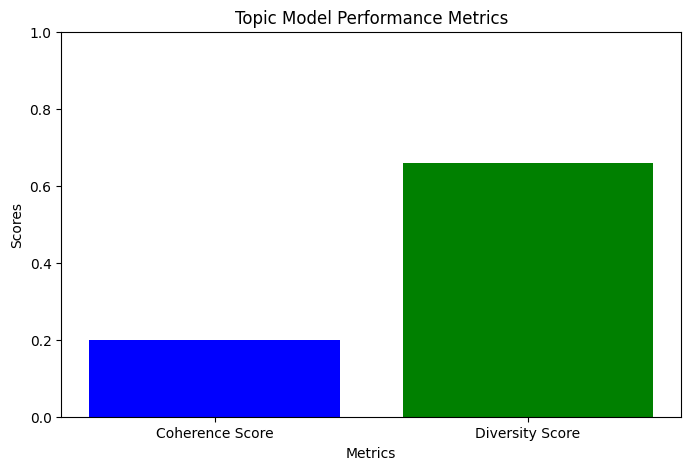

In [11]:
import matplotlib.pyplot as plt

# Example values (replace with your actual values)
# coherence_score = 0.17
# diversity_score = 0.45

# Data for plotting
scores = [topic_coherence, topic_diversity]
labels = ['Coherence Score', 'Diversity Score']# Create bar plot
plt.figure(figsize=(8, 5))
plt.bar(labels, scores, color=['blue', 'green'])
plt.xlabel('Metrics')
plt.ylabel('Scores')
plt.title('Topic Model Performance Metrics')
plt.ylim(0, 1)  # Assuming scores are between 0 and 1
plt.show()

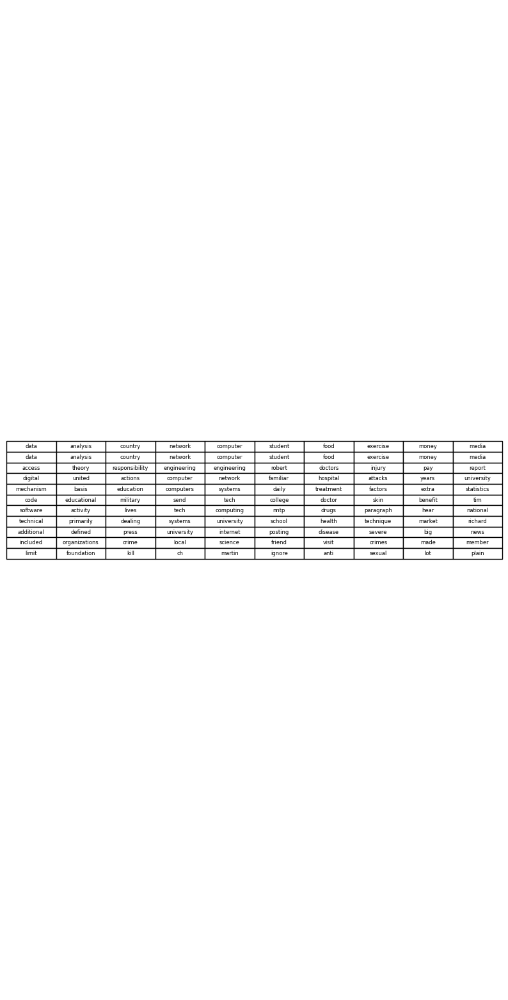

In [71]:
import pandas as pd
# Define your query words
query_words = ["data", "analysis","country", "network", "computer", "student", "food", "exercise", "money", "media"]
# Get the most similar words
most_similar_words = etm_instance.get_most_similar_words(queries=query_words, n_most_similar=10)

# Create a DataFrame from the dictionary
df = pd.DataFrame(most_similar_words)
fig, ax = plt.subplots(figsize=(10, 20))  # Set the size of the plot
ax.axis('tight')
ax.axis('off')
table = ax.table(cellText=df.values, colLabels=df.columns, cellLoc='center', loc='center')

tensor([[0.0088, 0.2279, 0.0116,  ..., 0.0079, 0.0075, 0.0183],
        [0.0075, 0.0080, 0.0100,  ..., 0.0089, 0.0077, 0.0079],
        [0.0315, 0.0472, 0.0151,  ..., 0.0117, 0.0106, 0.0093],
        ...,
        [0.0052, 0.0073, 0.0068,  ..., 0.0059, 0.3166, 0.0053],
        [0.0047, 0.0060, 0.0064,  ..., 0.0048, 0.0071, 0.0062],
        [0.0071, 0.0067, 0.0106,  ..., 0.0066, 0.0067, 0.0082]],
       device='cuda:0')


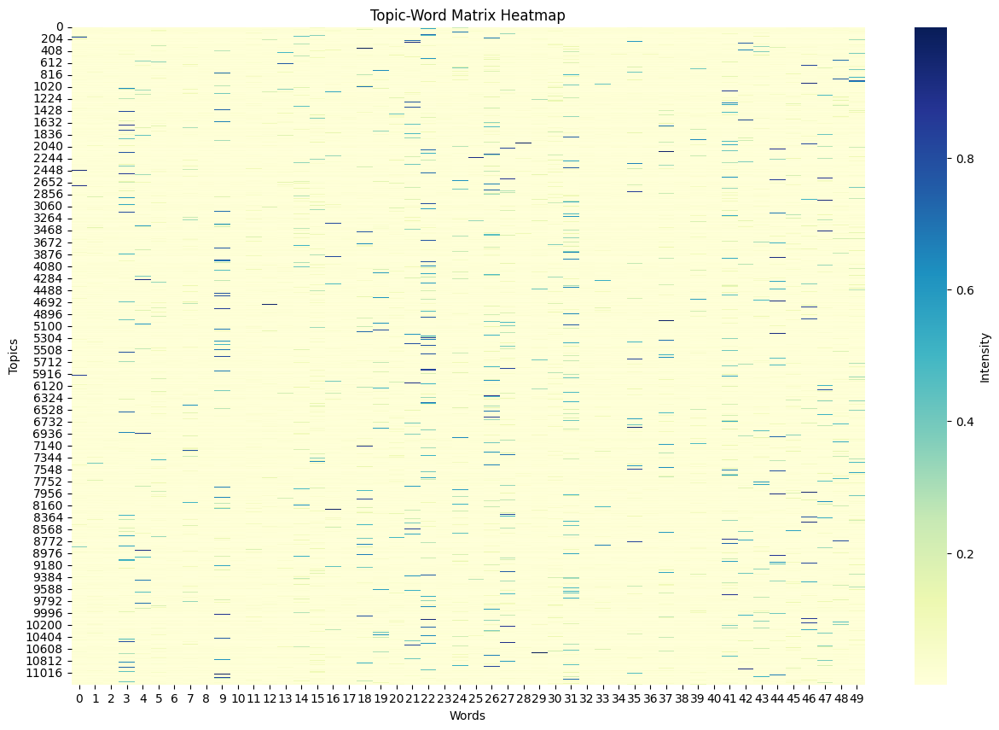

In [59]:
import torch
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming t_w_mtx is your topic-word matrix tensor
t_w_mtx = etm_instance.get_document_topic_dist()
print(t_w_mtx)

# Convert the tensor to a numpy array
t_w_mtx_np = t_w_mtx.cpu().detach().numpy()

# Plotting the heatmap with a larger figure size
plt.figure(figsize=(15, 10))  # Adjust the figure size as needed
sns.heatmap(t_w_mtx_np, cmap="YlGnBu", annot=False, cbar=True, cbar_kws={'label': 'Intensity'})
plt.xlabel('Words')
plt.ylabel('Topics')
plt.title('Topic-Word Matrix Heatmap')
plt.show()


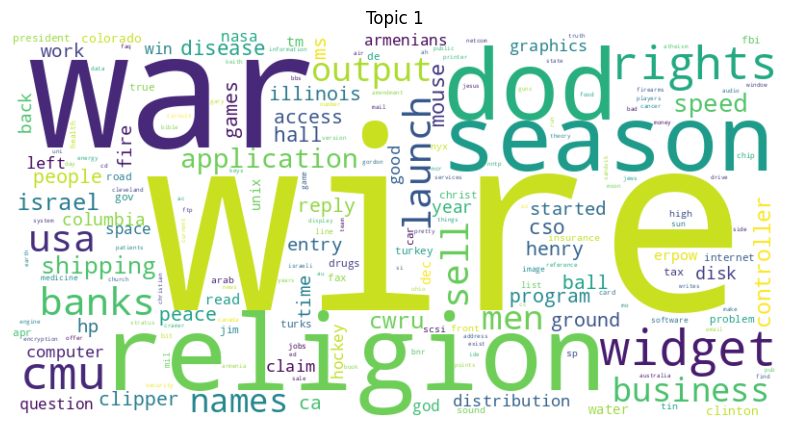

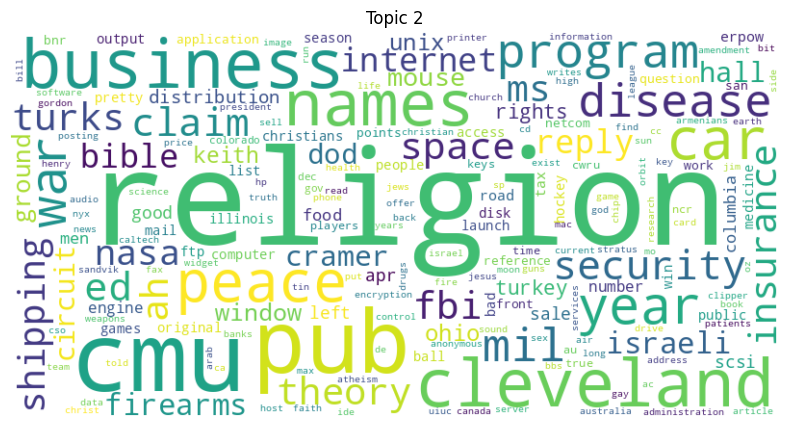

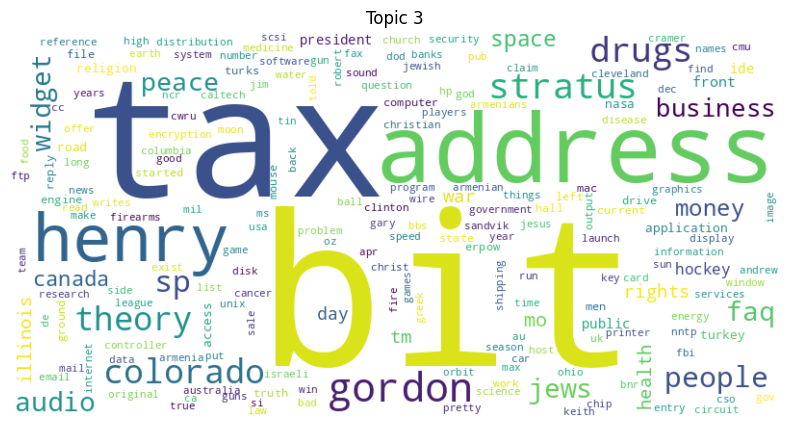

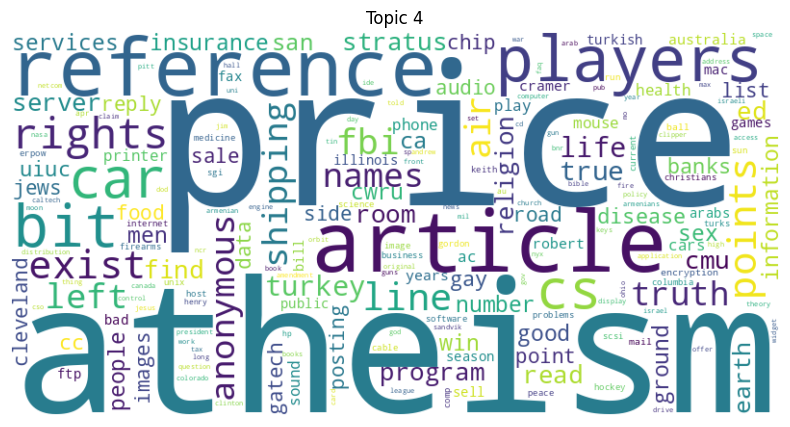

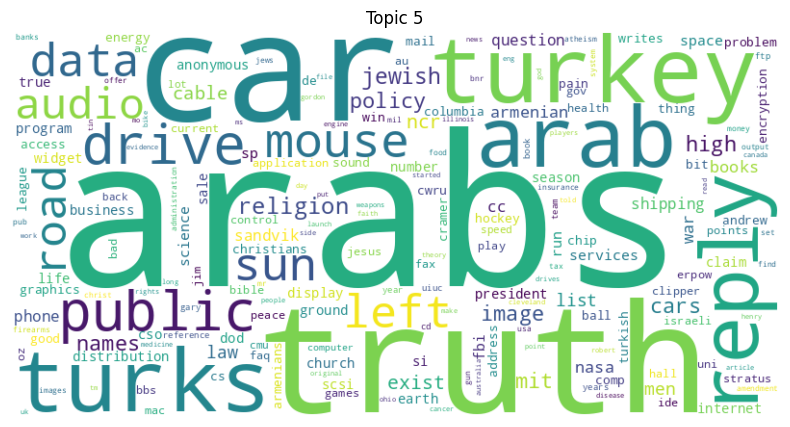

...

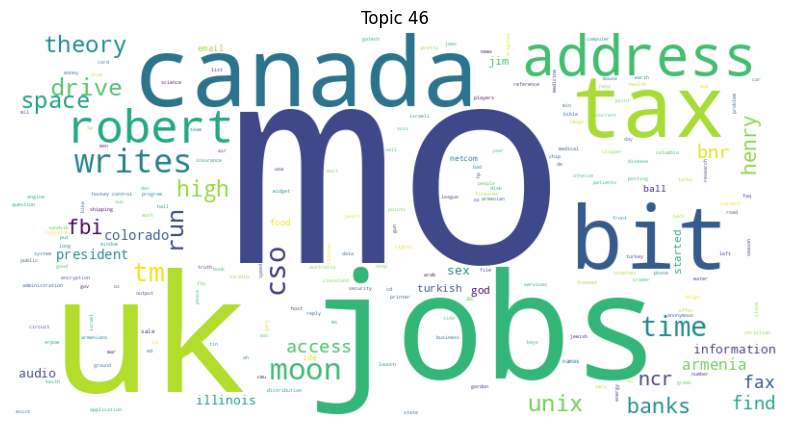

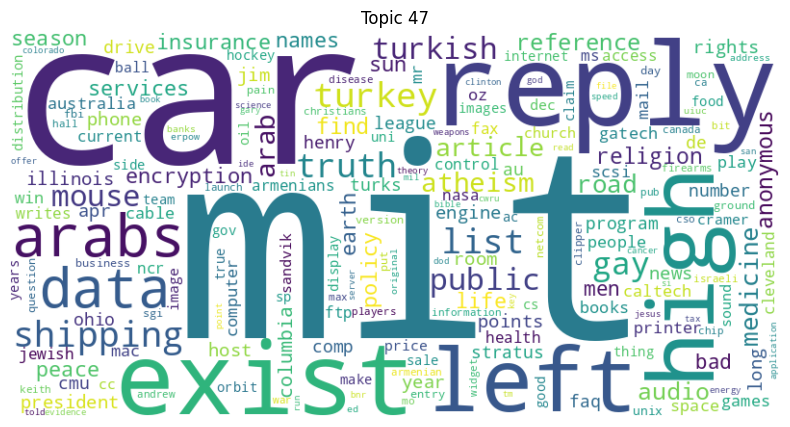

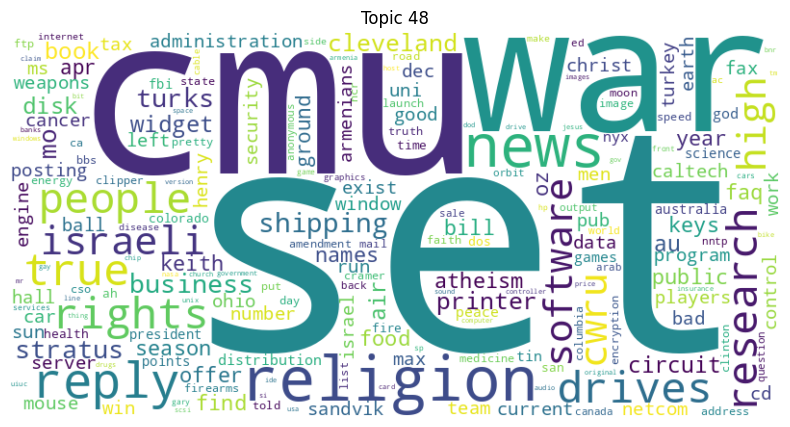

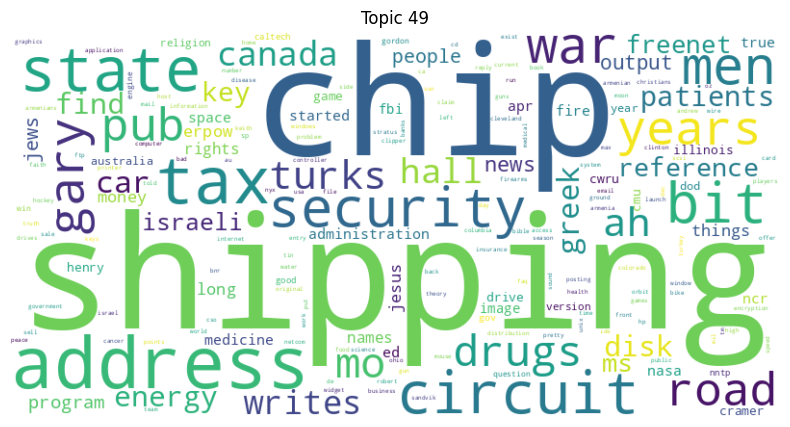

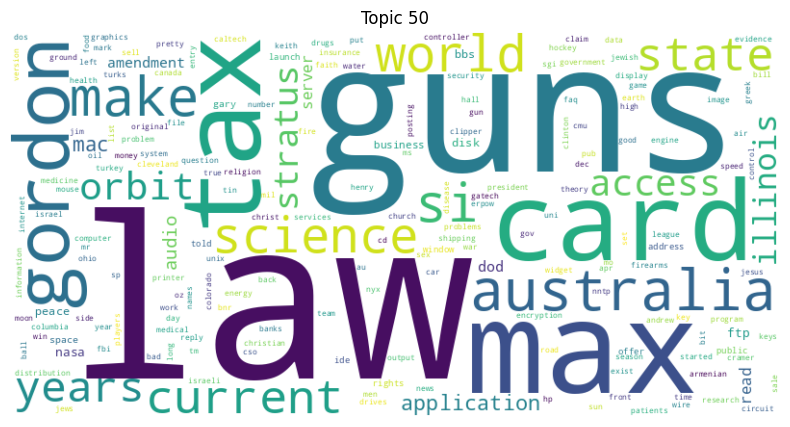

In [74]:
import torch
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Assuming t_w_mtx is your topic-word matrix tensor
t_w_mtx = etm_instance.get_topic_word_dist()

# Convert the tensor to a numpy array
t_w_mtx_np = t_w_mtx.cpu().detach().numpy()

# List of words (corresponding to the columns of the topic-word matrix)
word_list = ['writes', 'good', 'article', 'time', 'make', 'thing', 'lot', 'read', 'pretty', 'people',
             'erpow', 'wire', 'water', 'current', 'circuit', 'ground', 'audio', 'run', 'high', 'cable',
             'car', 'dod', 'bike', 'cars', 'article', 'engine', 'front', 'speed', 'road', 'oil',
             'good', 'time', 'writes', 'make', 'article', 'thing', 'people', 'lot', 'things', 'back',
             'space', 'nasa', 'gov', 'access', 'earth', 'launch', 'data', 'moon', 'orbit', 'henry',
             'good', 'time', 'make', 'lot', 'years', 'problem', 'thing', 'back', 'long', 'find',
             'mail', 'fax', 'access', 'information', 'unix', 'bbs', 'address', 'email', 'public', 'bill',
             'posting', 'article', 'nntp', 'host', 'writes', 'university', 'distribution', 'reply', 'cs', 'usa',
             'posting', 'nntp', 'host', 'writes', 'article', 'university', 'distribution', 'cs', 'reply', 'usa',
             'university', 'writes', 'posting', 'article', 'nntp', 'host', 'reply', 'distribution', 'cs',
             'computer', 'window', 'file', 'program', 'entry', 'widget', 'server', 'display', 'application', 'output',
             'set', 'turkish', 'armenian', 'armenians', 'people', 'armenia', 'turks', 'turkey', 'war', 'world', 'greek',
             'article', 'posting', 'university', 'host', 'nntp', 'writes', 'distribution', 'cs', 'reply', 'usa',
             'good', 'time', 'make', 'people', 'writes', 'thing', 'article', 'lot', 'things', 'back',
             'writes', 'article', 'posting', 'nntp', 'university', 'host', 'distribution', 'computer', 'reply', 'world',
             'god', 'people', 'religion', 'truth', 'christian', 'evidence', 'atheism', 'true', 'question', 'exist',
             'time', 'good', 'make', 'lot', 'thing', 'problem', 'work', 'back', 'things', 'years',
             'god', 'jesus', 'bible', 'people', 'church', 'christian', 'christ', 'christians', 'life', 'faith',
             'sale', 'price', 'shipping', 'offer', 'printer', 'cd', 'original', 'sell', 'sound', 'mail',
             'information', 'faq', 'list', 'anonymous', 'mail', 'send', 'internet', 'email', 'ftp', 'file',
             'max', 'ah', 'tm', 'mr', 'si', 'air', 'sp', 'mi', 'mo', 'cs',
             'article', 'writes', 'university', 'posting', 'nntp', 'host', 'distribution', 'computer', 'usa', 'reply',
             'people', 'home', 'time', 'told', 'left', 'started', 'back', 'room',
             'armenians', 'armenian', 'uk', 'ac', 'de', 'cmu', 'andrew', 'sun', 'eng', 'uni', 'ed', 'gatech',
             'people', 'point', 'make', 'things', 'bad', 'good', 'business', 'hall', 'claim', 'names',
             'drive', 'scsi', 'card', 'disk', 'mac', 'ide', 'controller', 'drives', 'bit', 'system',
             'uiuc', 'writes', 'cso', 'fbi', 'news', 'article', 'jim', 'stratus', 'illinois', 'fire',
             'key', 'encryption', 'chip', 'government', 'clipper', 'keys', 'security', 'system', 'law', 'public',
             'hp', 'netcom', 'mark', 'line', 'services', 'ncr', 'phone', 'number', 'san', 'tin',
             'good', 'time', 'make', 'thing', 'things', 'lot', 'people', 'years', 'problem', 'back',
             'good', 'time', 'make', 'thing', 'people', 'things', 'writes', 'lot', 'article', 'bad', 'back',
             'food', 'time', 'day', 'pain', 'problems', 'put', 'left', 'ball', 'side',
             'israel', 'israeli', 'jews', 'arab', 'sandvik', 'people', 'jewish', 'peace', 'arabs', 'policy',
             'ohio', 'cwru', 'keith', 'cleveland', 'pitt', 'caltech', 'gordon', 'sgi', 'freenet', 'banks',
             'writes', 'time', 'good', 'article', 'make', 'thing', 'lot', 'people', 'read', 'problem',
             'university', 'posting', 'article', 'writes', 'host', 'nntp', 'distribution', 'reply', 'world', 'cs',
             'people', 'law', 'sex', 'article', 'writes', 'cramer', 'men', 'drugs', 'rights', 'gay', 'ca', 'cs',
             'colorado', 'columbia', 'canada', 'cc', 'bnr', 'gary', 'nyx', 'university', 'health', 'medical',
             'disease', 'science', 'insurance', 'medicine', 'patients', 'research', 'people', 'cancer',
             'gun', 'guns', 'people', 'government', 'firearms', 'control', 'weapons', 'file', 'amendment', 'state',
             'team', 'game', 'year', 'play', 'games', 'players', 'season', 'hockey', 'win', 'league',
             'president', 'mr', 'clinton', 'jobs', 'tax', 'people', 'program', 'administration', 'work', 'money',
             'book', 'books', 'reference', 'points', 'time', 'point', 'find', 'theory', 'copy', 'energy',
             'image', 'graphics', 'ftp', 'software', 'version', 'files', 'pub', 'data', 'images', 'file',
             'university', 'writes', 'posting', 'article', 'nntp', 'host', 'distribution', 'reply', 'cs', 'usa',
             'article', 'writes', 'university', 'posting', 'nntp', 'host', 'distribution', 'reply', 'computer', 'cs',
             'writes', 'article', 'posting', 'university', 'host', 'nntp', 'distribution', 'reply', 'computer', 'cs',
             'au', 'mit', 'mil', 'apr', 'navy', 'oz', 'australia', 'dec', 'robert', 'comp',
             'article', 'writes', 'university', 'posting', 'host', 'nntp', 'distribution', 'reply', 'computer', 'world',
             'windows', 'dos', 'file', 'ms', 'system', 'mouse', 'files', 'run', 'win', 'problem']

def create_word_clouds(topic_word_matrix, words):
    num_topics = topic_word_matrix.shape[0]
    for topic_idx in range(num_topics):
        # Get the word distribution for the current topic
        word_distribution = topic_word_matrix[topic_idx]
        # Create a dictionary of words and their frequencies
        word_freq = {words[i]: word_distribution[i] for i in range(len(words))}
        # Generate the word cloud
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_freq)
        # Plot the word cloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.axis('off')
        plt.title(f'Topic {topic_idx + 1}')
        plt.show()

# Create word clouds for each topic
create_word_clouds(t_w_mtx_np, word_list)